# Accident Risk Spatio-Temporal Analysis andSeverity Estimation Using U.S. Crash Data

In [3]:
# import libraries
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# import csv and convert to df using pandas
df = pd.read_csv('US_Accidents_March23.csv')
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


In [3]:
# Basic info
print("Shape:", df.shape)
df.info()
df.describe(include='all')

Shape: (7728394, 46)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7728394 entries, 0 to 7728393
Data columns (total 46 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Source                 object 
 2   Severity               int64  
 3   Start_Time             object 
 4   End_Time               object 
 5   Start_Lat              float64
 6   Start_Lng              float64
 7   End_Lat                float64
 8   End_Lng                float64
 9   Distance(mi)           float64
 10  Description            object 
 11  Street                 object 
 12  City                   object 
 13  County                 object 
 14  State                  object 
 15  Zipcode                object 
 16  Country                object 
 17  Timezone               object 
 18  Airport_Code           object 
 19  Weather_Timestamp      object 
 20  Temperature(F)         float64
 21  Wind_Chill(F)          float64
 2

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
count,7728394,7728394,7.728394e+06,7728394,7728394,7.728394e+06,7.728394e+06,4.325632e+06,4.325632e+06,7.728394e+06,...,7728394,7728394,7728394,7728394,7728394,7728394,7705148,7705148,7705148,7705148
unique,7728394,3,NaN,6131796,6705355,NaN,NaN,NaN,NaN,NaN,...,2,2,2,2,2,1,2,2,2,2
top,A-1,Source1,NaN,2021-01-26 16:16:13,2021-11-22 08:00:00,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,False,False,Day,Day,Day,Day
freq,1,4325632,NaN,225,112,NaN,NaN,NaN,NaN,NaN,...,7728145,7526493,7514023,7720796,6584622,7728394,5334553,5695619,6076156,6377548
mean,NaN,NaN,2.212384e+00,NaN,NaN,3.620119e+01,-9.470255e+01,3.626183e+01,-9.572557e+01,5.618423e-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,4.875313e-01,NaN,NaN,5.076079e+00,1.739176e+01,5.272905e+00,1.810793e+01,1.776811e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,1.000000e+00,NaN,NaN,2.455480e+01,-1.246238e+02,2.456601e+01,-1.245457e+02,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,2.000000e+00,NaN,NaN,3.339963e+01,-1.172194e+02,3.346207e+01,-1.177543e+02,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,2.000000e+00,NaN,NaN,3.582397e+01,-8.776662e+01,3.618349e+01,-8.802789e+01,3.000000e-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,2.000000e+00,NaN,NaN,4.008496e+01,-8.035368e+01,4.017892e+01,-8.024709e+01,4.640000e-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


*Info*
- There are over 7 million entries, this data is very large.
- Multiple dtypes: bool(13), float64(12), int64(1), object(20).
- There are 46 columns.

### I will handle the data cleaning in this order:

1. Identify Missing Values
2. Handle Missing Data
3. Detect and Remove Duplicates
4. Check and Convert Data Types
5. Standardize Categorical Values
6. Handle Outliers
7. Feature Engineering for Date/Time Columns
8. Save Cleaned Data

## 1) Identify Missing Values

In [4]:
# Missing values
missing_counts=df.isnull().sum()
missing_percent = (missing_counts/ len(df))* 100
missing_summary = pd.DataFrame({'count': missing_counts, 'percent': missing_percent})

# Filter to show only columns with missing values
missing_summary = missing_summary[missing_summary['count'] > 0].sort_values('percent', ascending=False)

print(f"Columns with missing values:\n{missing_summary}")

Columns with missing values:
                         count    percent
End_Lat                3402762  44.029355
End_Lng                3402762  44.029355
Precipitation(in)      2203586  28.512858
Wind_Chill(F)          1999019  25.865904
Wind_Speed(mph)         571233   7.391355
Visibility(mi)          177098   2.291524
Wind_Direction          175206   2.267043
Humidity(%)             174144   2.253301
Weather_Condition       173459   2.244438
Temperature(F)          163853   2.120143
Pressure(in)            140679   1.820288
Weather_Timestamp       120228   1.555666
Sunrise_Sunset           23246   0.300787
Civil_Twilight           23246   0.300787
Nautical_Twilight        23246   0.300787
Astronomical_Twilight    23246   0.300787
Airport_Code             22635   0.292881
Street                   10869   0.140637
Timezone                  7808   0.101030
Zipcode                   1915   0.024779
City                       253   0.003274
Description                  5   0.000065


*Notes*
- Extremly high missing values = 44% >
- High missing values = (25%-30%)
- Moderate missing values (2-7%)
- Low missing values (2-7%)

### 2) Data handling 
- Remove columns extremly high missing values percentage
- Impute the rest using mean/median for numeric data
- Impute categorical values using mode 
- Drop rows with missing values that should not be imputed (City, Zipcode, Airportcode, Street, etc.)

In [5]:
# Remove the columns with extremely high values
extreme_missing_cols = missing_summary[missing_summary['percent'] > 44].index
df = df.drop(columns=extreme_missing_cols)
print(f" Dropped columns with 44% missing values: {list(extreme_missing_cols)}")

# Impute numeric columns with mean/median
for col in df.select_dtypes(include=[np.number]).columns:
    if df[col].isnull().any():
        median_val = df[col].median()
        df[col].fillna(median_val, inplace=True)
        print(f"Filled missing values in numeric column '{col} with median: {median_val}")

# Drop rows with missing values in critical cols
critical_cols = ['City', 'Zipcode', 'AIrport_Code', 'Street']
existing_critical = [col for col in critical_cols  if col in df.columns]
df.dropna(subset=existing_critical)
print(f"Dropped rows with missing values in critical columns: {existing_critical}")

# Impute categorical columns with mode
for col in df.select_dtypes(include=['object', 'category']).columns:
    if df[col].isnull().any():
        mode_val = df[col].mode().iloc[0]
        df[col].fillna(mode_val, inplace=True)
        print(f"Filled missing values in categorical column '{col} with mode: {mode_val}")


 Dropped columns with 44% missing values: ['End_Lat', 'End_Lng']


C:\Users\syamk\AppData\Local\Temp\ipykernel_44996\3281160489.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(median_val, inplace=True)


Filled missing values in numeric column 'Temperature(F) with median: 64.0
Filled missing values in numeric column 'Wind_Chill(F) with median: 62.0
Filled missing values in numeric column 'Humidity(%) with median: 67.0
Filled missing values in numeric column 'Pressure(in) with median: 29.86
Filled missing values in numeric column 'Visibility(mi) with median: 10.0
Filled missing values in numeric column 'Wind_Speed(mph) with median: 7.0
Filled missing values in numeric column 'Precipitation(in) with median: 0.0
Dropped rows with missing values in critical columns: ['City', 'Zipcode', 'Street']


C:\Users\syamk\AppData\Local\Temp\ipykernel_44996\3281160489.py:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mode_val, inplace=True)


Filled missing values in categorical column 'Description with mode: A crash has occurred causing no to minimum delays. Use caution.
Filled missing values in categorical column 'Street with mode: I-95 N
Filled missing values in categorical column 'City with mode: Miami
Filled missing values in categorical column 'Zipcode with mode: 91761
Filled missing values in categorical column 'Timezone with mode: US/Eastern
Filled missing values in categorical column 'Airport_Code with mode: KCQT
Filled missing values in categorical column 'Weather_Timestamp with mode: 2022-03-13 01:53:00
Filled missing values in categorical column 'Wind_Direction with mode: CALM
Filled missing values in categorical column 'Weather_Condition with mode: Fair
Filled missing values in categorical column 'Sunrise_Sunset with mode: Day
Filled missing values in categorical column 'Civil_Twilight with mode: Day
Filled missing values in categorical column 'Nautical_Twilight with mode: Day
Filled missing values in categoric

### 3) Identify and Remove Duplicates

In [6]:
# Check for duplicate rows
num_duplicates =df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 0


In [7]:
df.shape

(7728394, 44)

### 4) Check and Convert Datatypes
- Convert object to categories
- Convert object to datetime

In [8]:
# Check the current data types
print("The data types before conversion:")
print(df.dtypes)

# Convert the object columns to 'category' accordingly
exclude_cols = ['Description', 'Street', 'Zipcode', 'City', 'County'] # Exclude from conversion

for col in df.select_dtypes(include='object').columns:
    if col in exclude_cols:
        continue
    num_unique = df[col].nunique()
    num_total = len(df[col])
    if num_unique / num_total < 0.5:
        df[col] = df[col].astype('category')
        print(f"converted '{col} to category.")

# Convert date columns to date time 
time_cols = ['Start_Time', 'End_Time', 'Weather_Timestamp']
for col in time_cols:
    if col in df.columns:
        df[col] = pd.to_datetime(df[col], errors='coerce')
        print(f"Converted '{col} to datetime.")

# Check data types after conversion
print("Data types after the conversion:")
print(df.dtypes)

The data types before conversion:
ID                        object
Source                    object
Severity                   int64
Start_Time                object
End_Time                  object
Start_Lat                float64
Start_Lng                float64
Distance(mi)             float64
Description               object
Street                    object
City                      object
County                    object
State                     object
Zipcode                   object
Country                   object
Timezone                  object
Airport_Code              object
Weather_Timestamp         object
Temperature(F)           float64
Wind_Chill(F)            float64
Humidity(%)              float64
Pressure(in)             float64
Visibility(mi)           float64
Wind_Direction            object
Wind_Speed(mph)          float64
Precipitation(in)        float64
Weather_Condition         object
Amenity                     bool
Bump                        bool
Crossing 

### 5) Standardizd Categorical Values
- State abbreviations to its full name
- Remove '/' in 'Timezone' column


In [9]:
# Standardize all category and object columns
cat_cols = df.select_dtypes(include=['object', 'category']).columns
for col in cat_cols:
    df[col] = df[col].astype(str).str.lower().str.strip()
    print(f"Standardize values '{col}'.")

# Map state abbreviations to full names
us_state_abbrev = {
    'al': 'alabama', 'ak': 'alaska', 'az': 'arizona', 'ar': 'arkansas', 'ca': 'california',
    'co': 'colorado', 'ct': 'connecticut', 'de': 'delaware', 'fl': 'florida', 'ga': 'georgia',
    'hi': 'hawaii', 'id': 'idaho', 'il': 'illinois', 'in': 'indiana', 'ia': 'iowa',
    'ks': 'kansas', 'ky': 'kentucky', 'la': 'louisiana', 'me': 'maine', 'md': 'maryland',
    'ma': 'massachusetts', 'mi': 'michigan', 'mn': 'minnesota', 'ms': 'mississippi', 'mo': 'missouri',
    'mt': 'montana', 'ne': 'nebraska', 'nv': 'nevada', 'nh': 'new hampshire', 'nj': 'new jersey',
    'nm': 'new mexico', 'ny': 'new york', 'nc': 'north carolina', 'nd': 'north dakota', 'oh': 'ohio',
    'ok': 'oklahoma', 'or': 'oregon', 'pa': 'pennsylvania', 'ri': 'rhode island', 'sc': 'south carolina',
    'sd': 'south dakota', 'tn': 'tennessee', 'tx': 'texas', 'ut': 'utah', 'vt': 'vermont',
    'va': 'virginia', 'wa': 'washington', 'wv': 'west virginia', 'wi': 'wisconsin', 'wy': 'wyoming',
    'dc': 'district of columbia'
}

if 'State' in df.columns:
    df['State'] = df['State'].map(us_state_abbrev).fillna(df['State'])
    print("Standardized state abbreviations to full names.")

# Remove '/' in 'Timezone column
if 'Timezone' in df.columns:
    df['Timezone'] = df['Timezone'].str.replace('/', ' ', regex=False)
    print("Removed '/' in timezone column.")

Standardize values 'ID'.
Standardize values 'Source'.
Standardize values 'Description'.
Standardize values 'Street'.
Standardize values 'City'.
Standardize values 'County'.
Standardize values 'State'.
Standardize values 'Zipcode'.
Standardize values 'Country'.
Standardize values 'Timezone'.
Standardize values 'Airport_Code'.
Standardize values 'Wind_Direction'.
Standardize values 'Weather_Condition'.
Standardize values 'Sunrise_Sunset'.
Standardize values 'Civil_Twilight'.
Standardize values 'Nautical_Twilight'.
Standardize values 'Astronomical_Twilight'.
Standardized state abbreviations to full names.
Removed '/' in timezone column.


### 6) Handle the outliers accordingly
- Identify and visualize the outliers
- Remove the outliers using IQR method


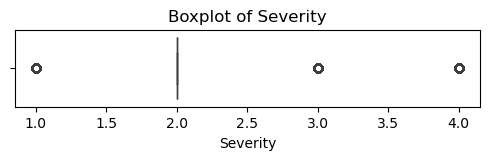

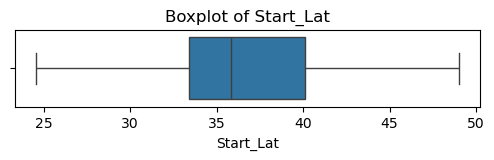

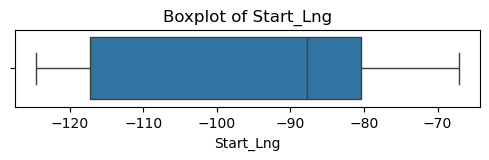

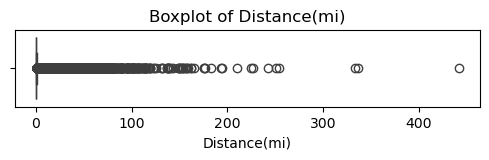

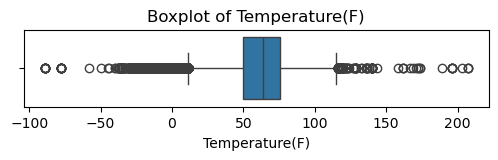

...

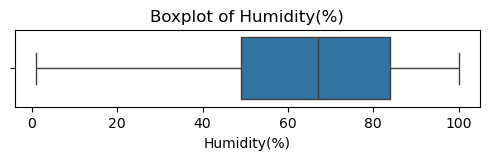

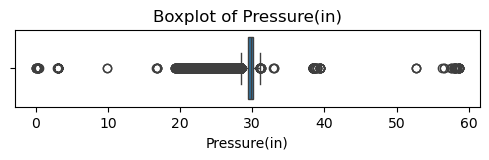

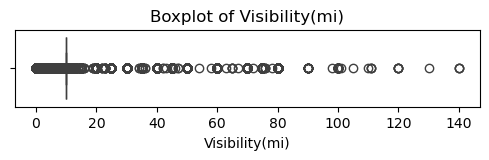

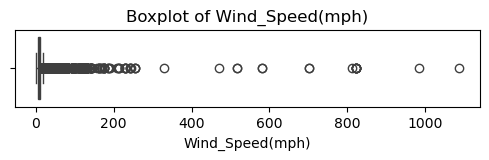

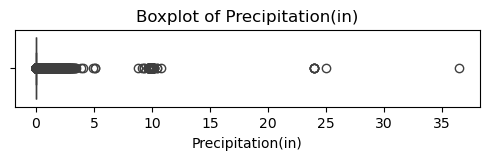

Removed 963606 outliers from 'Distance(mi)'.
Removed 51078 outliers from 'Temperature(F)'.
Removed 397466 outliers from 'Wind_Chill(F)'.
Removed 0 outliers from 'Humidity(%)'.
Removed 355498 outliers from 'Pressure(in)'.
Removed 1069368 outliers from 'Visibility(mi)'.
Removed 148672 outliers from 'Wind_Speed(mph)'.
Removed 112224 outliers from 'Precipitation(in)'.


In [10]:
# Visualize outliers 
num_cols = df.select_dtypes(include=[np.number]).columns
for col in num_cols:
    plt.figure(figsize=(6,1))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

# Remove outliers using IQR method
exclude_outliers = ['Severity', 'Start_Lat', 'Start_Lng'] # Exclude these columns
for col in num_cols:
    if col in exclude_outliers:
        continue
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    before = df.shape[0]
    df = df[(df[col] >= lower) & (df[col] <= upper)]
    after = df.shape[0]
    print(f"Removed {before - after} outliers from '{col}'.")

### 6) Feature Engineering For Date/Time
- Create new columns ('Start_Hour', 'Start_DayOfWeek', 'Start_Month', 'Is_Weekend')
- Calculate accident duration and create 'Duratio_Minutes' column

In [11]:
# Extracr hour, day of week, month, and weekend flag
df['Start_Hour'] = df['Start_Time'].dt.hour
df['Start_DayOfWeek'] = df['Start_Time'].dt.dayofweek #0=Monday
df['Start_Month'] = df['Start_Time'].dt.month
df['Is_Weekend'] = df['Start_DayOfWeek'].isin([5,6]).astype(int)

# Calculate accident duration in minutes
df['Duration_Minutes'] = (df['End_Time'] - df['Start_Time']).dt.total_seconds()/60

# Preview the new features created
print(df[['Start_Time', 'End_Time', 'Start_Hour', 'Start_DayOfWeek', 'Start_Month', 'Is_Weekend', 'Duration_Minutes']].head())

            Start_Time            End_Time  Start_Hour  Start_DayOfWeek  \
1  2016-02-08 06:07:59 2016-02-08 06:37:59         6.0              0.0   
2  2016-02-08 06:49:27 2016-02-08 07:19:27         6.0              0.0   
13 2016-02-08 08:37:07 2016-02-08 09:07:07         8.0              0.0   
17 2016-02-08 09:24:37 2016-02-08 09:54:37         9.0              0.0   
18 2016-02-08 09:25:17 2016-02-08 09:55:17         9.0              0.0   

    Start_Month  Is_Weekend  Duration_Minutes  
1           2.0           0              30.0  
2           2.0           0              30.0  
13          2.0           0              30.0  
17          2.0           0              30.0  
18          2.0           0              30.0  


In [12]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,Street,...,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight,Start_Hour,Start_DayOfWeek,Start_Month,Is_Weekend,Duration_Minutes
1,a-2,source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,0.01,accident on brice rd at tussing rd. expect del...,brice rd,...,False,night,night,night,day,6.0,0.0,2.0,0,30.0
2,a-3,source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,0.01,accident on oh-32 state route 32 westbound at ...,state route 32,...,False,night,night,day,day,6.0,0.0,2.0,0,30.0
13,a-14,source2,2,2016-02-08 08:37:07,2016-02-08 09:07:07,39.790760,-84.241547,0.01,accident on salem ave at hillcrest ave / kensi...,salem ave,...,False,day,day,day,day,8.0,0.0,2.0,0,30.0
17,a-18,source2,2,2016-02-08 09:24:37,2016-02-08 09:54:37,39.752174,-84.239952,0.00,accident on delphos ave at brooklyn ave. expec...,delphos ave,...,False,day,day,day,day,9.0,0.0,2.0,0,30.0
18,a-19,source2,2,2016-02-08 09:25:17,2016-02-08 09:55:17,39.740669,-84.184135,0.01,accident on stewart st near rubicon st. expect...,rubicon st,...,False,day,day,day,day,9.0,0.0,2.0,0,30.0


In [13]:
# Df new shape
df.shape

(4630482, 49)

In [ ]:
# Save as 'cleaned_accident_data'
df.to_csv('cleaned_accident_data.csv', index=False)

In [4]:
accidents=pd.read_csv("cleaned_accident_data.csv")

In [5]:
# data before conversion 
accidents[["Distance(mi)", "Visibility(mi)", "Pressure(in)", "Wind_Speed(mph)", "Precipitation(in)", "Temperature(F)", "Wind_Chill(F)"]]

,Distance(mi),Visibility(mi),Pressure(in),Wind_Speed(mph),Precipitation(in),Temperature(F),Wind_Chill(F)
0,0.010,10.0,29.65,7.0,0.0,37.9,62.0
1,0.010,10.0,29.67,3.5,0.0,36.0,33.3
2,0.010,10.0,29.65,5.8,0.0,36.0,31.1
3,0.000,10.0,29.65,5.8,0.0,36.0,31.1
4,0.010,10.0,29.63,6.9,0.0,37.4,32.1
...,...,...,...,...,...,...,...
4630477,0.000,10.0,28.78,6.0,0.0,81.0,81.0
4630478,0.543,10.0,28.92,13.0,0.0,86.0,86.0
4630479,0.338,10.0,29.39,6.0,0.0,70.0,70.0
4630480,0.561,10.0,29.74,10.0,0.0,73.0,73.0


In [6]:
# convert distance from miles ro kilometers
accidents["Distance(km)"]=accidents["Distance(mi)"]*1.609344

# convert visibility from miles to kilometers.
accidents["Visibility(km)"] = accidents["Visibility(mi)"] * 1.609344


# convert pressure in the air from inches to millimeter.
accidents["Pressure(mm)"] = accidents["Pressure(in)"] * 25.4

# convert wind speed from miles per hour to kilometers per hour.
accidents["Wind_Speed(kmh)"] = accidents["Wind_Speed(mph)"] * 1.609344

# convert precipitation from inches to millimeter.
accidents["Precipitation(mm)"] = accidents["Precipitation(in)"] * 25.4

# convert temperature from fahrenheit to celsius
accidents["Temperature(C)"] = (accidents["Temperature(F)"] - 32) * 5/9

# convert wind chill fahrenheit to celsius
accidents["Wind_Chill(C)"] = (accidents["Wind_Chill(F)"] - 32) * 5/9

In [7]:
# let's see the data after conversion
accidents[["Distance(km)", "Visibility(km)", "Pressure(mm)", "Wind_Speed(kmh)", "Precipitation(mm)", "Temperature(C)", "Wind_Chill(C)"]]

,Distance(km),Visibility(km),Pressure(mm),Wind_Speed(kmh),Precipitation(mm),Temperature(C),Wind_Chill(C)
0,0.016093,16.09344,753.110,11.265408,0.0,3.277778,16.666667
1,0.016093,16.09344,753.618,5.632704,0.0,2.222222,0.722222
2,0.016093,16.09344,753.110,9.334195,0.0,2.222222,-0.500000
3,0.000000,16.09344,753.110,9.334195,0.0,2.222222,-0.500000
4,0.016093,16.09344,752.602,11.104474,0.0,3.000000,0.055556
...,...,...,...,...,...,...,...
4630477,0.000000,16.09344,731.012,9.656064,0.0,27.222222,27.222222
4630478,0.873874,16.09344,734.568,20.921472,0.0,30.000000,30.000000
4630479,0.543958,16.09344,746.506,9.656064,0.0,21.111111,21.111111
4630480,0.902842,16.09344,755.396,16.093440,0.0,22.777778,22.777778


In [8]:
# remove old columns 
accidents.drop(["Distance(mi)", "Visibility(mi)", "Pressure(in)", "Wind_Speed(mph)", "Precipitation(in)", "Temperature(F)", "Wind_Chill(F)"], axis=1, inplace=True)

In [9]:
accidents['Start_Time']

0          2016-02-08 06:07:59
1          2016-02-08 06:49:27
2          2016-02-08 08:37:07
3          2016-02-08 09:24:37
4          2016-02-08 09:25:17
                  ...         
4630477    2019-08-23 18:30:23
4630478    2019-08-23 18:03:25
4630479    2019-08-23 19:11:30
4630480    2019-08-23 19:00:21
4630481    2019-08-23 19:00:21
Name: Start_Time, Length: 4630482, dtype: object

In [10]:
# list "Start_Time" column dates lengths
date_lengths = accidents["Start_Time"].str.len()
print(date_lengths.value_counts())

Start_Time
19.0    4237904
Name: count, dtype: int64


In [11]:
date_lengths[1]

19.0

In [12]:
accidents.sample(5)

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Description,Street,City,...,Start_Month,Is_Weekend,Duration_Minutes,Distance(km),Visibility(km),Pressure(mm),Wind_Speed(kmh),Precipitation(mm),Temperature(C),Wind_Chill(C)
1391338,a-2110404,source2,3,2019-05-18 11:58:23,2019-05-18 13:12:01,34.038048,-118.276451,accident on i-10 eastbound at exits 10 11 12 c...,i-10 e,los angeles,...,5.0,1,73.633333,0.000000,16.09344,756.158,9.656064,0.0,21.666667,21.666667
3643564,a-6001610,source1,2,2021-06-19 15:02:00,2021-06-19 16:31:26,40.007549,-75.201217,incident on i-76 eb near mp 340 drive with cau...,i-76 e,philadelphia,...,6.0,1,89.433333,1.065386,16.09344,755.904,16.093440,0.0,31.111111,31.111111
2843944,a-4499635,source1,2,2022-06-01 09:54:08,2022-06-01 11:09:09,37.876924,-76.456915,incident on va-201 nb near indian valley rd dr...,courthouse rd,heathsville,...,6.0,0,75.016667,0.749954,16.09344,759.714,8.046720,0.0,32.222222,32.222222
964844,a-1436436,source2,2,2020-08-25 08:01:31,2020-08-25 10:00:24,25.966431,-80.347771,accident on 48th ct at 152nd ter.,lakeside dr,hollywood,...,8.0,0,118.883333,0.000000,16.09344,761.492,16.093440,0.0,29.444444,29.444444
209090,a-278953,source2,2,2016-11-14 08:50:10,2016-11-14 09:49:59,29.673485,-95.295601,accident on bellfort st at lancaster st.,lancaster st,houston,...,11.0,0,59.816667,0.016093,16.09344,766.318,11.265408,0.0,18.888889,16.666667


In [13]:
# slice all "Start_Time" column dates to legth of 19
accidents["Start_Time_parsed"]=accidents["Start_Time"].str[:19]

# parse "Start_Time" column to datetime 
accidents["Start_Time_parsed"] = pd.to_datetime(accidents["Start_Time_parsed"], format="%Y-%m-%d %H:%M:%S")
accidents["Start_Time_parsed"]

0         2016-02-08 06:07:59
1         2016-02-08 06:49:27
2         2016-02-08 08:37:07
3         2016-02-08 09:24:37
4         2016-02-08 09:25:17
                  ...        
4630477   2019-08-23 18:30:23
4630478   2019-08-23 18:03:25
4630479   2019-08-23 19:11:30
4630480   2019-08-23 19:00:21
4630481   2019-08-23 19:00:21
Name: Start_Time_parsed, Length: 4630482, dtype: datetime64[ns]

In [14]:
accidents["End_Time"]

0          2016-02-08 06:37:59
1          2016-02-08 07:19:27
2          2016-02-08 09:07:07
3          2016-02-08 09:54:37
4          2016-02-08 09:55:17
                  ...         
4630477    2019-08-23 18:58:54
4630478    2019-08-23 18:32:01
4630479    2019-08-23 19:38:23
4630480    2019-08-23 19:28:49
4630481    2019-08-23 19:29:42
Name: End_Time, Length: 4630482, dtype: object

In [15]:
date_lengths = accidents["End_Time"].str.len()
date_lengths.value_counts()

End_Time
19.0    4237904
Name: count, dtype: int64

In [16]:
# slice all "End_Time" column dates to length of 19
accidents["End_Time_parsed"] = accidents["End_Time"].str[:19]

# parse "Start_Time" column into datetime
accidents["End_Time_parsed"] = pd.to_datetime(accidents["End_Time_parsed"], format="%Y-%m-%d %H:%M:%S")
accidents["End_Time_parsed"]

0         2016-02-08 06:37:59
1         2016-02-08 07:19:27
2         2016-02-08 09:07:07
3         2016-02-08 09:54:37
4         2016-02-08 09:55:17
                  ...        
4630477   2019-08-23 18:58:54
4630478   2019-08-23 18:32:01
4630479   2019-08-23 19:38:23
4630480   2019-08-23 19:28:49
4630481   2019-08-23 19:29:42
Name: End_Time_parsed, Length: 4630482, dtype: datetime64[ns]

In [17]:
# weather timestamp
accidents["Weather_Timestamp"]

0          2016-02-08 05:51:00
1          2016-02-08 06:56:00
2          2016-02-08 08:56:00
3          2016-02-08 08:56:00
4          2016-02-08 09:38:00
                  ...         
4630477    2019-08-23 18:50:00
4630478    2019-08-23 17:53:00
4630479    2019-08-23 18:53:00
4630480    2019-08-23 18:53:00
4630481    2019-08-23 18:51:00
Name: Weather_Timestamp, Length: 4630482, dtype: object

In [18]:
# check for weather timestamp different lengths
date_lengths = accidents["Weather_Timestamp"].str.len()
date_lengths.value_counts()

Weather_Timestamp
19    4630482
Name: count, dtype: int64

In [19]:
accidents["Weather_Timestamp_parsed"] = accidents["Weather_Timestamp"].str[:19]
# check for weather timestamp different lengths
date_lengths = accidents["Weather_Timestamp_parsed"].str.len()
date_lengths.value_counts()

Weather_Timestamp_parsed
19    4630482
Name: count, dtype: int64

In [20]:
# parse timestamp to datetime
accidents["Weather_Timestamp_parsed"] = pd.to_datetime(accidents["Weather_Timestamp_parsed"], format="%Y-%m-%d %H:%M:%S")
accidents["Weather_Timestamp_parsed"]

0         2016-02-08 05:51:00
1         2016-02-08 06:56:00
2         2016-02-08 08:56:00
3         2016-02-08 08:56:00
4         2016-02-08 09:38:00
                  ...        
4630477   2019-08-23 18:50:00
4630478   2019-08-23 17:53:00
4630479   2019-08-23 18:53:00
4630480   2019-08-23 18:53:00
4630481   2019-08-23 18:51:00
Name: Weather_Timestamp_parsed, Length: 4630482, dtype: datetime64[ns]

In [21]:
# rename "Start/End_Time_parsed" to "Start/End_Time" and remove old columns
accidents["Start_Time"] = accidents["Start_Time_parsed"]
accidents["End_Time"] = accidents["End_Time_parsed"]
accidents["Weather_Timestamp"] = accidents["Weather_Timestamp_parsed"]
accidents.drop(["Start_Time_parsed", "End_Time_parsed", "Weather_Timestamp_parsed"], axis=1, inplace=True)

In [22]:
accidents['Start_Year'] = accidents['Start_Time'].dt.year.astype('category')
accidents['Start_Year'].value_counts().to_frame().style.bar(cmap='RdYlBu_r')

,count
Start_Year,
2021.000000,794774
2022.000000,705241
2020.000000,680432
2018.000000,588915
2019.000000,585949
2017.000000,495574
2016.000000,308277
2023.000000,78742


In [23]:
accidents['State'].value_counts().to_frame().style.bar(cmap='RdYlBu_r')

,count
State,
california,1098952
florida,663702
texas,397710
south carolina,279977
north carolina,239630
new york,186515
virginia,183410
pennsylvania,142956
georgia,109210


In [24]:
state_year_count = pd.pivot_table(accidents, values='ID', index=['State'], columns=['Start_Year'], aggfunc='count').style.bar(cmap='RdYlBu_r',axis=1)
state_year_count

C:\Users\syamk\AppData\Local\Temp\ipykernel_40652\1571462079.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  state_year_count = pd.pivot_table(accidents, values='ID', index=['State'], columns=['Start_Year'], aggfunc='count').style.bar(cmap='RdYlBu_r',axis=1)


Start_Year,2016.000000,2017.000000,2018.000000,2019.000000,2020.000000,2021.000000,2022.000000,2023.000000
State,,,,,,,,
alabama,92,1936,10121,14359,12992,13991,11349,371
arizona,1780,10430,19434,12566,9593,8757,7463,1225
arkansas,21,69,309,556,1505,2976,2877,212
california,112936,113599,112709,149199,177012,166362,149410,26337
colorado,551,3635,6729,1188,103,103,187,48
connecticut,2505,2860,2633,2741,4338,6717,6519,763
delaware,194,670,1054,1049,1420,2124,1371,49
district of columbia,392,635,758,1214,1944,3131,3458,321
florida,30790,47480,51473,46049,90833,161533,138861,11299


C:\Users\syamk\AppData\Local\Temp\ipykernel_40652\500611467.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  monthly_trend = accidents.groupby(['Start_Year', 'Start_Month']).size().reset_index(name='Accident_Count')


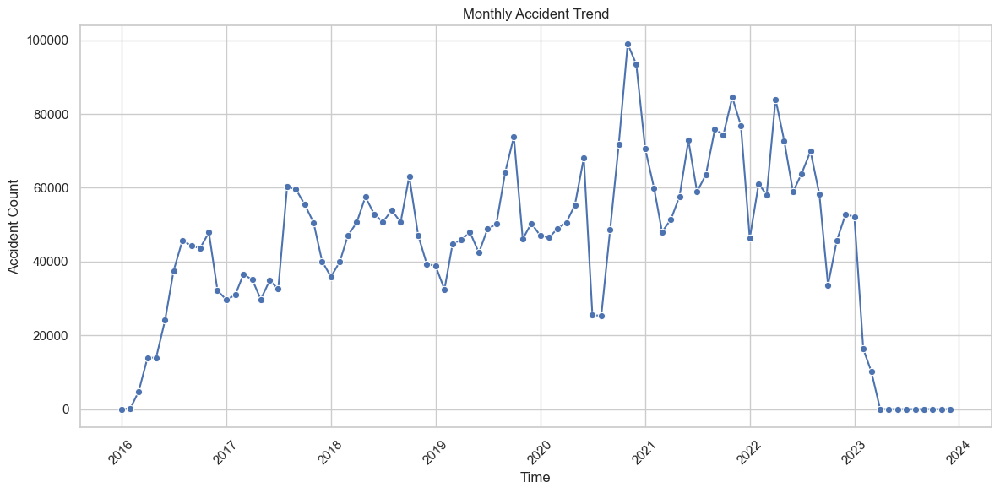

In [44]:
# -- 1. Monthly Trend --
monthly_trend = accidents.groupby(['Start_Year', 'Start_Month']).size().reset_index(name='Accident_Count')

# Convert to datetime
monthly_trend['Year-Month'] = pd.to_datetime(
    monthly_trend[['Start_Year', 'Start_Month']]
    .rename(columns={'Start_Year': 'year', 'Start_Month': 'month'})
    .assign(day=1)
)

# Plot
plt.figure(figsize=(12,6))
sns.lineplot(data=monthly_trend, x='Year-Month', y='Accident_Count', marker='o')
plt.title("Monthly Accident Trend")
plt.xlabel("Time")
plt.ylabel("Accident Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

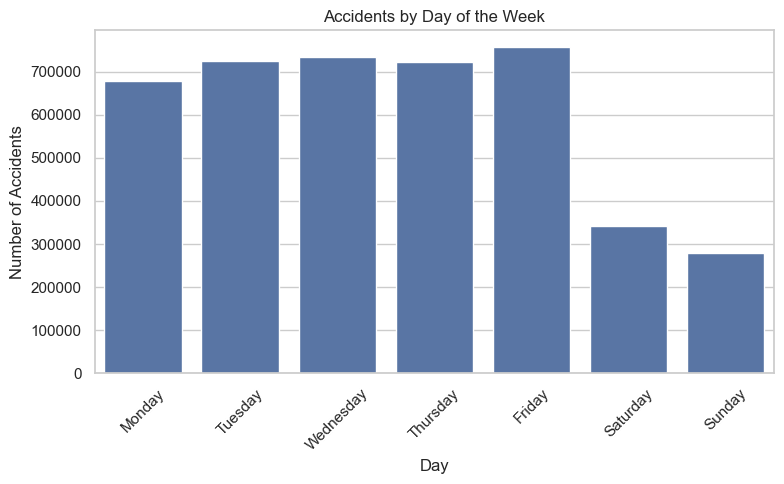

In [46]:
# Ensure correct day ordering
accidents['Start_Weekday'] = accidents['Start_Time'].dt.day_name()
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
accidents['Start_Weekday'] = pd.Categorical(accidents['Start_Weekday'], categories=weekday_order, ordered=True)

# Plot
plt.figure(figsize=(8,5))
sns.countplot(data=accidents, x='Start_Weekday', order=weekday_order)
plt.title('Accidents by Day of the Week')
plt.xlabel('Day')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


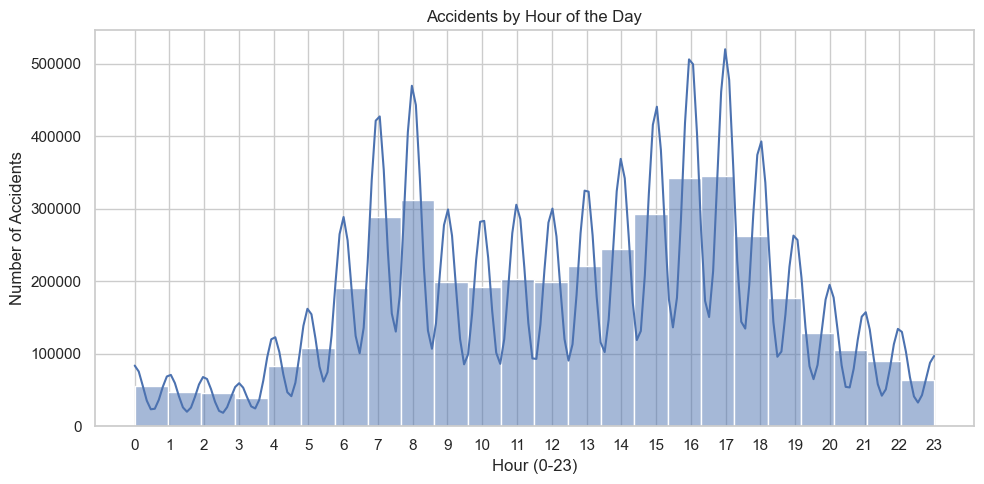

In [47]:
# Ensure Start_Hour is numeric and clean
accidents['Start_Hour'] = pd.to_numeric(accidents['Start_Hour'], errors='coerce')

# Plot
plt.figure(figsize=(10,5))
sns.histplot(accidents['Start_Hour'].dropna(), bins=24, kde=True)
plt.title('Accidents by Hour of the Day')
plt.xlabel('Hour (0-23)')
plt.ylabel('Number of Accidents')
plt.xticks(range(0, 24))
plt.tight_layout()
plt.show()


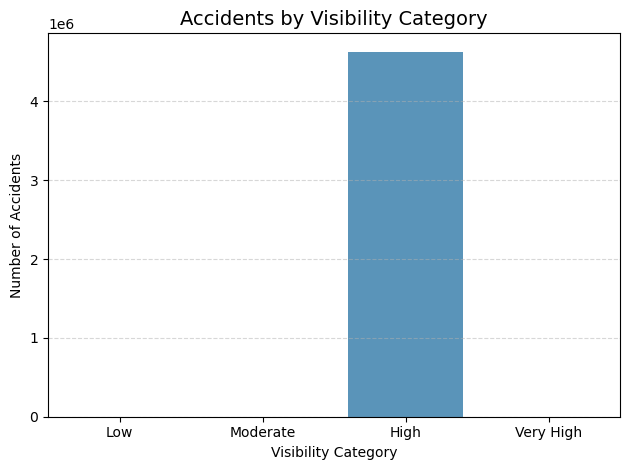

In [25]:
#Effect of visibility on the number of accidents
# Sort values into bins
accidents['Visibility_Category'] = pd.cut(
    accidents['Visibility(km)'], 
    bins=[0, 2*1.609344, 5*1.609344, 10*1.609344, 15*1.609344], 
    labels=['Low', 'Moderate', 'High', 'Very High']
)

visibility_category_accidents = accidents['Visibility_Category'].value_counts().sort_index()

# plt.figure(figsize=(8, 6))
sns.barplot(
    x=visibility_category_accidents.index, 
    y=visibility_category_accidents.values, 
    palette='Blues', hue=visibility_category_accidents.index
)
plt.title('Accidents by Visibility Category', fontsize=14)
plt.xlabel('Visibility Category', fontsize=10)
plt.ylabel('Number of Accidents', fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

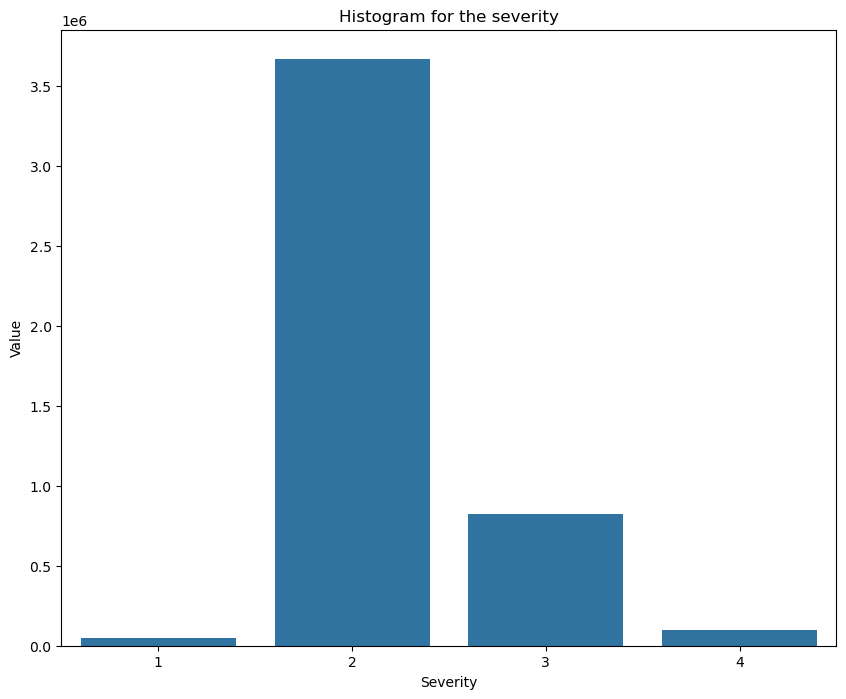

In [26]:
#check if the data is unbalenced
severity_counts = accidents["Severity"].value_counts()

plt.figure(figsize=(10, 8))
plt.title("Histogram for the severity")
sns.barplot(x=severity_counts.index, y=severity_counts.values)
plt.xlabel("Severity")
plt.ylabel("Value")
plt.show()

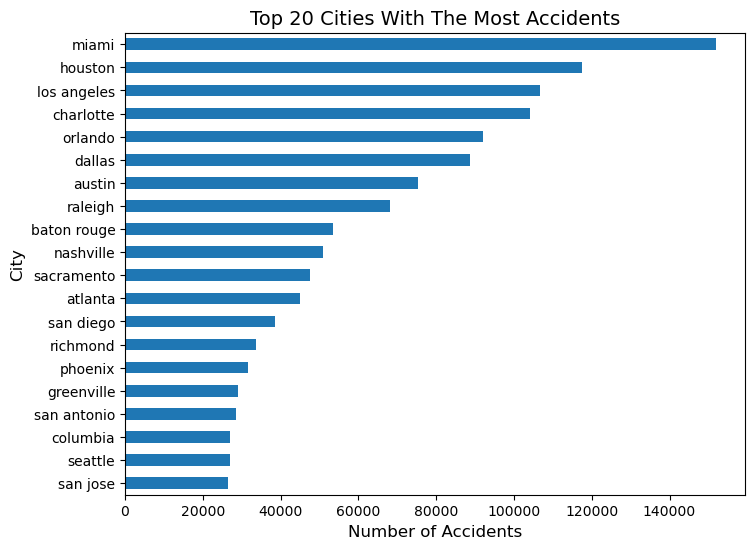

In [27]:
# top 20 cities with the most accidents
#Accidents by city
plt.figure(figsize=(8,6))
top_cities =accidents['City'].value_counts().head(20).sort_values()
top_cities.plot(kind='barh')
plt.title('Top 20 Cities With The Most Accidents', fontsize=14)
plt.xlabel('Number of Accidents', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.show()

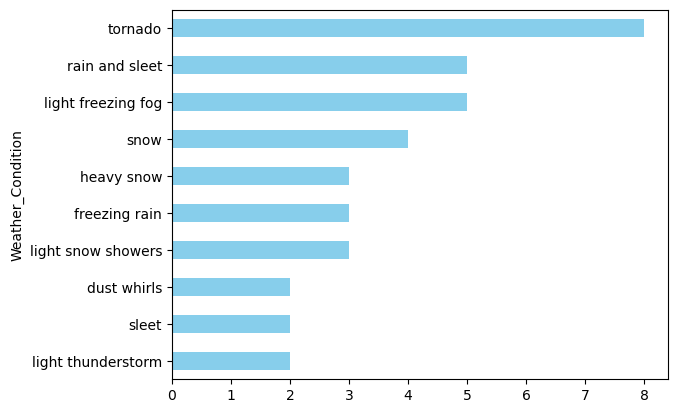

In [28]:
#Weather conditions contributing the most to the overall severity in Texas
severity_weather = accidents.groupby('Weather_Condition')['Severity'].sum().sort_values(ascending=True).head(10)
# print(severity_weather)
severity_weather.plot(kind='barh', color='skyblue')
plt.show()

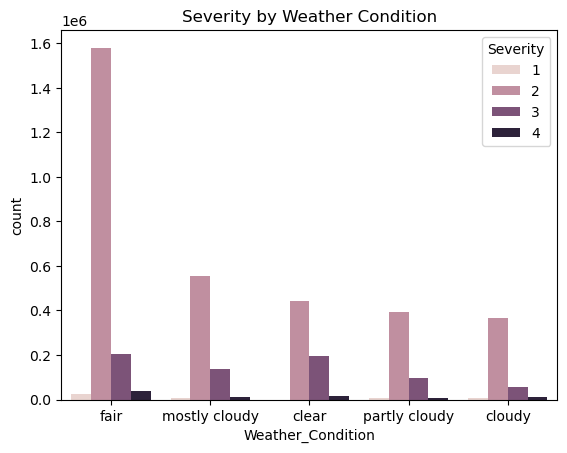

In [29]:
sns.countplot(x='Weather_Condition', hue='Severity', data=accidents, 
              order=accidents['Weather_Condition'].value_counts().index[:5])
plt.title('Severity by Weather Condition')
plt.xticks()
plt.show()

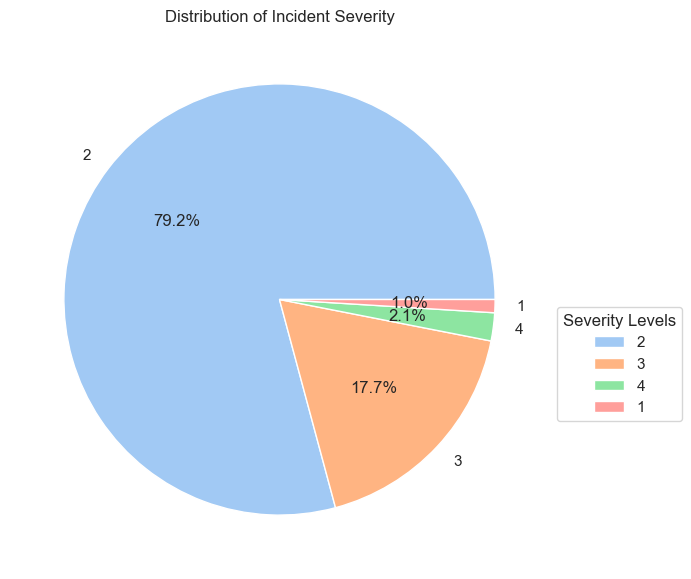

In [30]:
# Count the occurrences of each severity level
severity_count = accidents['Severity'].value_counts()

# Create the pie chart
sns.set(style="whitegrid")
plt.figure(figsize=(10, 7))
pastel_colors = sns.color_palette("pastel", len(severity_count))

plt.pie(
    severity_count,
    labels=severity_count.index,
    autopct='%1.1f%%',
    colors=pastel_colors
)
plt.legend(title='Severity Levels', loc='best', bbox_to_anchor=(1, 0.5))
plt.title('Distribution of Incident Severity')
plt.show()

In [31]:
accidents["Severity"].value_counts() 

Severity
2    3666597
3     821100
4      97313
1      45472
Name: count, dtype: int64

In [32]:
from sklearn.preprocessing import LabelEncoder

le_weather = LabelEncoder()
le_state = LabelEncoder()

accidents['Weather_Condition'] = le_weather.fit_transform(accidents['Weather_Condition'].astype(str))
accidents['State'] = le_state.fit_transform(accidents['State'].astype(str))

In [33]:
min_class_count = accidents["Severity"].value_counts().min()

# undersampling the classes to match the minimum count and to prevent memory error 
accidents_final = accidents.groupby('Severity').apply(lambda x: x.sample(n=min_class_count, random_state=42))
accidents_final = accidents_final.reset_index(drop=True)
# shuffling
accidents_final = accidents_final.sample(frac=1, random_state=42).reset_index(drop=True)

accidents_final['Severity'].value_counts() 

C:\Users\syamk\AppData\Local\Temp\ipykernel_40652\4069779512.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  accidents_final = accidents.groupby('Severity').apply(lambda x: x.sample(n=min_class_count, random_state=42))


Severity
1    45472
4    45472
3    45472
2    45472
Name: count, dtype: int64

Type de 'Severity': int64
Type of 'Severity' after selection: int64


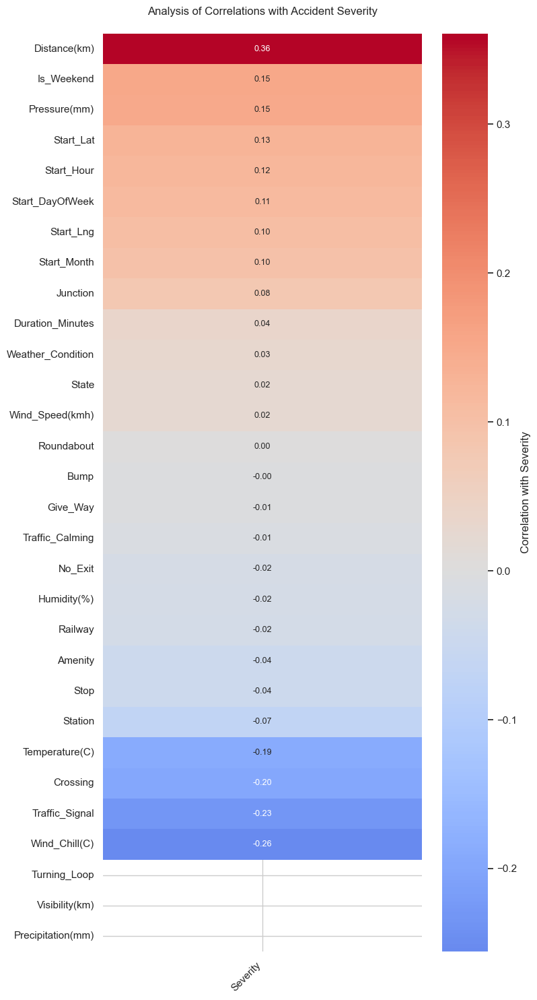


🔍 Top 10 Most Gravity-Related Features:


,Severity
Distance(km),0.361
Wind_Chill(C),-0.256
Traffic_Signal,-0.234
Crossing,-0.198
Temperature(C),-0.189
Is_Weekend,0.152
Pressure(mm),0.150
Start_Lat,0.128
Start_Hour,0.122
Start_DayOfWeek,0.114


In [34]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Check data type of 'Severity'
print("Type de 'Severity':", accidents_final['Severity'].dtype)

# 2. Convert Boolean to 0/1 
for col in accidents_final.select_dtypes(include=['bool']).columns:
    accidents_final[col] = accidents_final[col].astype(int)

# 3. Selecting numeric columns while forcing inclusion of 'Severity'
numeric_cols = accidents_final.select_dtypes(include=['number']).columns
if 'Severity' not in numeric_cols:
    numeric_cols = list(numeric_cols) + ['Severity']  # Ajout explicite

accidents_final = accidents_final[numeric_cols]

# 4. Final verification

print("Type of 'Severity' after selection:", accidents_final['Severity'].dtype)

# 5. Correlation calculations
corr_matrix = accidents_final.corr()
corr_with_severity = corr_matrix[['Severity']].drop(index='Severity').sort_values('Severity', ascending=False)

# 6. Enhanced Visualizations
plt.figure(figsize=(8, max(6, len(corr_with_severity)/2)))
sns.heatmap(corr_with_severity, 
            annot=True, 
            cmap='coolwarm',
            center=0,
            fmt='.2f',
            annot_kws={'size': 9},
            cbar_kws={'label': 'Correlation with Severity'})

plt.title('Analysis of Correlations with Accident Severity', pad=20)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 7. Analysis of Top 10 Most Correlated Features (Absolute Value)
top_10 = corr_with_severity.assign(Absolute=corr_with_severity['Severity'].abs()) \
                          .sort_values('Absolute', ascending=False) \
                          .head(10) \
                          .drop(columns='Absolute')

print("\n🔍 Top 10 Most Gravity-Related Features:")
display(top_10.style
       .background_gradient(cmap='coolwarm', vmin=-1, vmax=1)
       .set_caption('Correlations with Severity (absolute value)')
       .format({'Severity': '{:.3f}'}))

In [35]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import joblib

In [36]:
accidents.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'Description', 'Street', 'City', 'County', 'State',
       'Zipcode', 'Country', 'Timezone', 'Airport_Code', 'Weather_Timestamp',
       'Humidity(%)', 'Wind_Direction', 'Weather_Condition', 'Amenity', 'Bump',
       'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout',
       'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight', 'Start_Hour', 'Start_DayOfWeek', 'Start_Month',
       'Is_Weekend', 'Duration_Minutes', 'Distance(km)', 'Visibility(km)',
       'Pressure(mm)', 'Wind_Speed(kmh)', 'Precipitation(mm)',
       'Temperature(C)', 'Wind_Chill(C)', 'Start_Year', 'Visibility_Category'],
      dtype='object')

Train: 127321 
Val: 27283 
Test: 27284 

Validation Set Performance:
              precision    recall  f1-score   support

           1       0.77      0.90      0.83      6821
           2       0.61      0.47      0.53      6820
           3       0.59      0.63      0.61      6821
           4       0.66      0.64      0.65      6821

    accuracy                           0.66     27283
   macro avg       0.66      0.66      0.65     27283
weighted avg       0.66      0.66      0.65     27283


Test Set Performance:
              precision    recall  f1-score   support

           1       0.76      0.90      0.83      6821
           2       0.62      0.48      0.54      6821
           3       0.58      0.62      0.60      6821
           4       0.66      0.64      0.65      6821

    accuracy                           0.66     27284
   macro avg       0.66      0.66      0.66     27284
weighted avg       0.66      0.66      0.66     27284



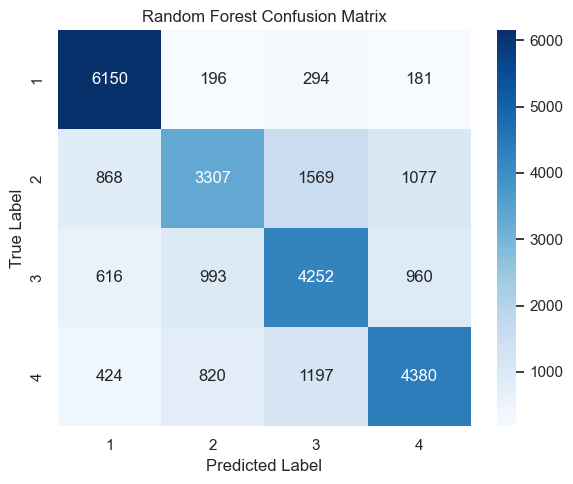

In [55]:
# 1. Feature selection based on correlations
selected_features = [
    'Start_Month', 'Start_Hour', 'Start_DayOfWeek','Traffic_Signal',
    'Start_Lat', 'Start_Lng','Temperature(C)','Visibility(km)','Wind_Speed(kmh)',
    'Pressure(mm)','Precipitation(mm)','Weather_Condition','State','Humidity(%)'
]

X = accidents_final[selected_features]
y = accidents_final['Severity']

# 2. Split the data (70% train, 15% val, 15% test)
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, 
    test_size=0.3, 
    random_state=42, 
    stratify=y 
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, 
    test_size=0.5, 
    random_state=42, 
    stratify=y_temp
)

print(f"Train: {X_train.shape[0]} ")
print(f"Val: {X_val.shape[0]} ") 
print(f"Test: {X_test.shape[0]} ")

# 3. Model Optimization (with best found parameters)
best_rf = RandomForestClassifier(
    n_estimators=200,
    max_depth=20,
    min_samples_split=5,
    min_samples_leaf=2,
    class_weight='balanced',
    random_state=42,
    n_jobs=-1
)

# 4. Training on Train Set
best_rf.fit(X_train, y_train)

# Save the trained model
joblib.dump(best_rf, "severity_model.pkl")

# 5. Validation Set Evaluation
y_val_pred = best_rf.predict(X_val)
print("\nValidation Set Performance:")
print(classification_report(y_val, y_val_pred))

# 6. Final Evaluation on Test Set (Only When Model is Finalized)
y_pred_rf = best_rf.predict(X_test)
print("\nTest Set Performance:")
print(classification_report(y_test, y_pred_rf))


cm = confusion_matrix(y_test, y_pred_rf)
labels = sorted(y_test.unique())  # assuming Severity is categorical

# Plot
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Random Forest Confusion Matrix')
plt.tight_layout()
plt.show()


In [53]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report,precision_score,recall_score,f1_score
xgb_model = XGBClassifier(random_state=42, eval_metric='mlogloss')

Accuracy: 0.6642721008649758
              precision    recall  f1-score   support

           0       0.75      0.90      0.82      6821
           1       0.63      0.50      0.56      6821
           2       0.59      0.64      0.62      6821
           3       0.66      0.62      0.64      6821

    accuracy                           0.66     27284
   macro avg       0.66      0.66      0.66     27284
weighted avg       0.66      0.66      0.66     27284



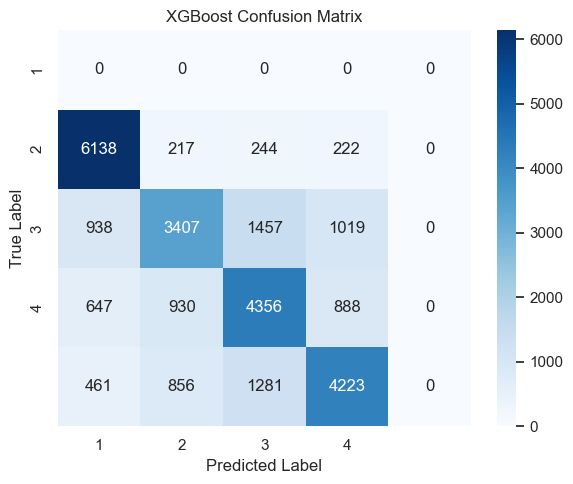

In [57]:
# Adjust target labels to start from 0
y_train_adj = y_train - 1
y_test_adj = y_test - 1

# Fit with adjusted labels
xgb_model.fit(X_train, y_train_adj)

# Predict and evaluate
y_pred_xgb = xgb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test_adj, y_pred))
print(classification_report(y_test_adj, y_pred_xgb))

cm = confusion_matrix(y_test, y_pred_xgb)
labels = sorted(y_test.unique())  # assuming Severity is categorical

# Plot
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('XGBoost Confusion Matrix')
plt.tight_layout()
plt.show()

In [54]:
# Define a helper function
def get_scores(y_true, y_pred):
    return {
        'Accuracy': accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred, average='weighted'),
        'Recall': recall_score(y_true, y_pred, average='weighted'),
        'F1-Score': f1_score(y_true, y_pred, average='weighted')
    }

# Store results
comparison_df = pd.DataFrame({
    'Random Forest': get_scores(y_test, y_pred_rf),
    'XGBoost': get_scores(y_test, y_pred_xgb)
})

# Transpose for readability
comparison_df = comparison_df.T.round(3)
comparison_df

C:\Users\syamk\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\syamk\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Accuracy,Precision,Recall,F1-Score
Random Forest,0.663,0.658,0.663,0.657
XGBoost,0.094,0.095,0.094,0.094


In [39]:
import hdbscan
import numpy as np
from sklearn.preprocessing import StandardScaler


coords = accidents_final[['Start_Lat', 'Start_Lng']].values
scaler = StandardScaler()
coords_scaled = scaler.fit_transform(coords)  # Important pour HDBSCAN

In [40]:
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=50,          
    min_samples=10,               
    cluster_selection_epsilon=0.02,  
    metric='haversine',           
    alpha=1.0                     
)

accidents_final['Cluster'] = clusterer.fit_predict(coords_scaled)

In [41]:
accidents_final.to_csv("accidents_final_with_clusters.csv", index=False)

In [42]:
cluster_stats = accidents_final.groupby('Cluster').agg({
    'Severity': 'mean',
    'Start_Lat': 'count',
    'Traffic_Signal': 'mean'
}).rename(columns={
    'Start_Lat': 'Accident_Count',
    'Traffic_Signal': 'TrafficSignal_Ratio'
}).sort_values('Accident_Count', ascending=False)

print("Top 5 zones of risk:")
print(cluster_stats.head(5))

Top 5 zones of risk:
         Severity  Accident_Count  TrafficSignal_Ratio
Cluster                                               
36       2.636826           86124             0.188461
38       2.245214           31654             0.264074
13       2.040264           16839             0.100362
14       2.596913           16587             0.092301
19       2.573611            5040             0.181151


In [43]:
import folium
import pandas as pd
import numpy as np
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


# Create a color map for severity
def get_severity_color(severity):
    """Return color based on severity level (1-4)"""
    if severity == 4:
        return 'darkred'    # Most severe
    elif severity == 3:
        return 'red'
    elif severity == 2:
        return 'orange'
    else:
        return 'green'      # Least severe

# Create a base map centered on the mean coordinates
center_lat = accidents_final['Start_Lat'].mean()
center_lng = accidents_final['Start_Lng'].mean()
accident_map = folium.Map(location=[center_lat, center_lng], zoom_start=5)

# Add a title to the map
title_html = '''
             <h3 align="center" style="font-size:16px"><b>Traffic Accidents Map</b></h3>
             '''
accident_map.get_root().html.add_child(folium.Element(title_html))

# Create marker clusters to handle many points efficiently
marker_cluster = MarkerCluster().add_to(accident_map)

# Sample the data if there are too many points (optional)
# Adjust sample_size based on your dataset size and performance considerations
sample_size = min(10000, len(accidents_final))
if len(accidents_final) > sample_size:
    sampled_df = accidents_final.sample(sample_size, random_state=42)
else:
    sampled_df = accidents_final

# Add CircleMarkers for each accident, colored by severity
for idx, row in sampled_df.iterrows():
    # Get color based on severity
    color = get_severity_color(row['Severity'])
    
    # Create popup text with accident details
    popup_text = f"""
    <b>Severity:</b> {row['Severity']}<br>
    <b>Cluster:</b> {row['Cluster']}<br>
    """
    
    # Add more details to popup if available
    if 'Weather_Condition' in row:
        popup_text += f"<b>Weather:</b> {row['Weather_Condition']}<br>"
    if 'Description' in row:
        popup_text += f"<b>Description:</b> {row['Description'][:100]}...<br>"
    
    # Create and add the marker
    folium.CircleMarker(
        location=[row['Start_Lat'], row['Start_Lng']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(marker_cluster)

# Add legend for severity
legend_html = '''
<div style="position: fixed; 
     bottom: 50px; right: 50px; width: 150px; height: 120px; 
     border:2px solid grey; z-index:9999; font-size:14px; background-color:white;
     padding: 10px">
     <b>Severity Levels</b><br>
     <i class="fa fa-circle" style="color:darkred"></i> Level 4 (Highest)<br>
     <i class="fa fa-circle" style="color:red"></i> Level 3<br>
     <i class="fa fa-circle" style="color:orange"></i> Level 2<br>
     <i class="fa fa-circle" style="color:green"></i> Level 1 (Lowest)<br>
</div>
'''
accident_map.get_root().html.add_child(folium.Element(legend_html))

# Add cluster summary information (optional)
if 'Cluster' in accidents_final.columns:
    # Get top clusters (excluding noise cluster -1)
    top_clusters = cluster_stats[cluster_stats.index >= 0].head(5)
    
    cluster_html = '''
    <div style="position: fixed; 
         top: 50px; right: 50px; width: 200px; 
         border:2px solid grey; z-index:9999; font-size:14px; background-color:white;
         padding: 10px">
         <b>Top 5 Risk Zones</b><br>
    '''
    
    for cluster_id, row in top_clusters.iterrows():
        cluster_html += f"Cluster {cluster_id}: {int(row['Accident_Count'])} accidents<br>"
    
    cluster_html += '</div>'
    accident_map.get_root().html.add_child(folium.Element(cluster_html))

# Optional: Add a heatmap view (uncomment if needed)
'''
from folium.plugins import HeatMap
# Create a separate heatmap layer
heat_data = [[row['Start_Lat'], row['Start_Lng'], row['Severity']] for idx, row in sampled_df.iterrows()]
HeatMap(heat_data, radius=15, gradient={0.2: 'blue', 0.4: 'green', 0.6: 'yellow', 0.8: 'orange', 1: 'red'}).add_to(accident_map)
'''

# Save the map to an HTML file
accident_map.save('traffic_accidents_map.html')

# Display map in Jupyter notebook (if running in notebook)
accident_map